<a href="https://colab.research.google.com/github/chizhenn/DS-ML-Projects/blob/main/Trading_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import io
import requests
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

df = pd.read_csv('/content/gdrive/MyDrive/UM_datathon_2024.csv')

# Exploratory Data Analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41498 entries, 0 to 41497
Data columns (total 43 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   time                                  41498 non-null  object 
 1   difficulty                            41363 non-null  float64
 2   estimated_leverage_ratio              41498 non-null  float64
 3   addresses_count_active                41498 non-null  int64  
 4   addresses_count_sender                41498 non-null  int64  
 5   addresses_count_receiver              41498 non-null  int64  
 6   exchange_whale_ratio                  41498 non-null  float64
 7   coinbase_premium_gap                  41466 non-null  float64
 8   coinbase_premium_index                41466 non-null  float64
 9   coinbase_premium_gap_usdt_adjusted    41466 non-null  float64
 10  coinbase_premium_index_usdt_adjusted  41466 non-null  float64
 11  taker_buy_volum

* From df.info(),we can find out this dataset has a total of 41498 rows and 42 columns (excluding ``time``)

* The columns in the dataset consists of ``float64`` datatype, and ``int64`` datatype, all data are numeric

* The target output is ``close_price``



The dataset consists of time series data (1-hour interval):

It is a sequence of data points collected or recorded at specific time intervals. It is important to identify trends, patterns, or seasonality over time, while also making predictions for future values.

In [ ]:
df.head(5)

,time,difficulty,estimated_leverage_ratio,addresses_count_active,addresses_count_sender,addresses_count_receiver,exchange_whale_ratio,coinbase_premium_gap,coinbase_premium_index,coinbase_premium_gap_usdt_adjusted,...,long_liquidations,short_liquidations,long_liquidations_usd,short_liquidations_usd,open_price,high_price,low_price,close_price,volume,open_interest
0,2020-03-25 10:00:00,1.655292e+13,0.070577,30656,12888,21617,0.940847,12.50,0.189479,1.125713,...,425.717,8.770,2.831061e+06,58055.69835,6500.0,6591.5,6500.0,6591.5,0.004,1.198203e+08
1,2020-03-25 11:00:00,1.655292e+13,0.071966,21379,8467,14875,0.885981,18.64,0.285830,2.369076,...,385.434,21.699,2.499324e+06,142518.22527,6591.5,6628.5,6457.5,6511.5,438.873,1.211306e+08
2,2020-03-25 12:00:00,1.655292e+13,0.072686,29164,13292,19201,0.884669,17.17,0.260595,7.388429,...,6.060,35.155,3.950575e+04,230609.80208,6511.5,6588.5,6502.0,6583.5,529.318,1.236765e+08
3,2020-03-25 13:00:00,NaN,0.070549,0,0,0,0.000000,16.12,0.245213,4.339870,...,106.667,134.954,7.070354e+05,898106.41361,6583.5,6745.5,6562.0,6585.0,449.162,1.197917e+08
4,2020-03-25 14:00:00,1.655292e+13,0.071959,25234,10221,18363,0.867330,14.46,0.218125,-2.762051,...,124.720,52.400,8.154464e+05,347108.26236,6585.0,6640.0,6516.0,6590.0,258.831,1.228579e+08


In [ ]:
df['time'] = pd.to_datetime(df['time'])

Converting to datetime provides:

- Robustness and flexibility for date/time operations.
- Improved accuracy and performance.
- Error detection for invalid date formats.

# Drop column based on correlation matrix

We have removed the features with high correlation in order to highlight only the important factors that contribute to the target variable, making the dataset simpler and more manageable.

In [ ]:
#Correlation matrix
corr = df.corr()
plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt = '.2f')
plt.title('Correlation Matrix')
plt.show()


Factors that should be dropped:
- address_count_active consolidates address_count_sender & receiver
- coinbase_premium_gap consolidates the other 3 coinbase factors
- taker_buy_volume and taker_sell_volume same. Take one only.
- blockreward & blockreward_usd same. Take blockreward_usd
- fee_transaction variables all similar. Take fee_transaction_median_usd
- Take transaction_count_outflow, no need inflow
- Take tokens_transferred mean, drop tokens_transferred_total
- Drop low_price, high_price_ open_price
- Take long liquid and short liquid, drop the usd counterpart
- Take taker_buy_sell ratio only

In [ ]:
df = df.drop(columns=['addresses_count_sender', 'addresses_count_receiver', 'coinbase_premium_index',
                      'coinbase_premium_gap_usdt_adjusted', 'coinbase_premium_index_usdt_adjusted',
                      'taker_sell_volume','blockreward', 'taker_buy_ratio','taker_sell_ratio',
                      'fees_transaction_mean','fees_transaction_mean_usd','fees_transaction_median',
                      'tokens_transferred_total', 'transactions_count_inflow','low_price','high_price',
                      'open_price','long_liquidations_usd','short_liquidations_usd'])

# Data preprocessing


## Data cleaning


Check for **duplicated rows** in the dataset

In [ ]:
# Check for total sum of the duplicate rows in the DataFrame and count the total number of duplicates
df.duplicated().sum()

0

Since the dataset is related to a time series problem, we need to identify whether the data has a trend and seasonality, in order to decide how to handle the missing data.

1st Method

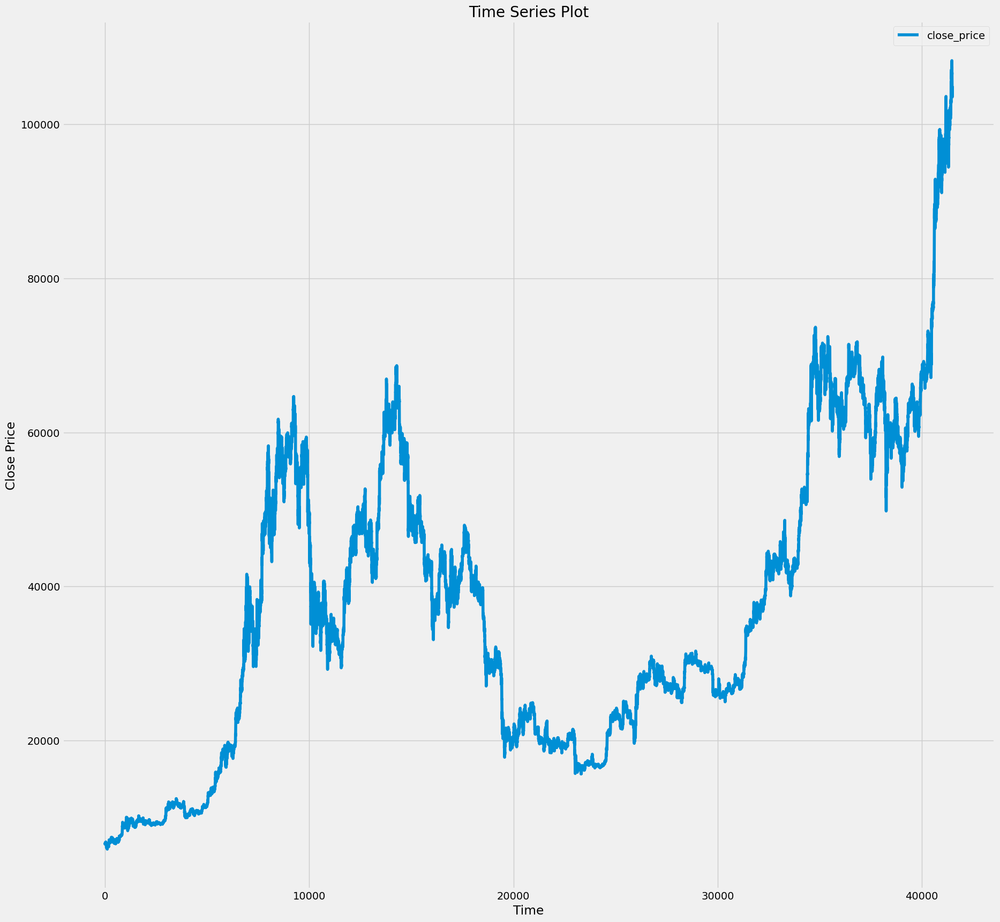

In [ ]:
#Time series plot of target variable, close_price
plt.plot(df['close_price'], label='close_price')
plt.xlabel('Time')
plt.ylabel('Close Price')
plt.title('Time Series Plot')
plt.legend()
plt.grid(True)
plt.show()


There is a clear upward trend in the data, particularly towards the latter part of the time series. This indicates that the overall level of the time series is increasing over time.

There doesn't appear to be a clear repeating pattern at regular intervals, which would indicate seasonality. The fluctuations seem irregular and do not follow a consistent cyclical pattern. The fluctuations in the plot could be due to other factors such as market volatility, news events, or economic conditions, rather than seasonality.

2nd Method

In [ ]:
#Check if data is stationary/no trend
from statsmodels.tsa.stattools import adfuller

result = adfuller(df['close_price'])
print("ADF Statistic:", result[0])
print("p-value:", result[1])


ADF Statistic: 0.4110546909412266
p-value: 0.9819036727410623


Since the p-value (0.9819) is much greater than the significance level (commonly 0.05), we fail to reject the null hypothesis. This means the data is non-stationary and likely has a trend.


3rd Method

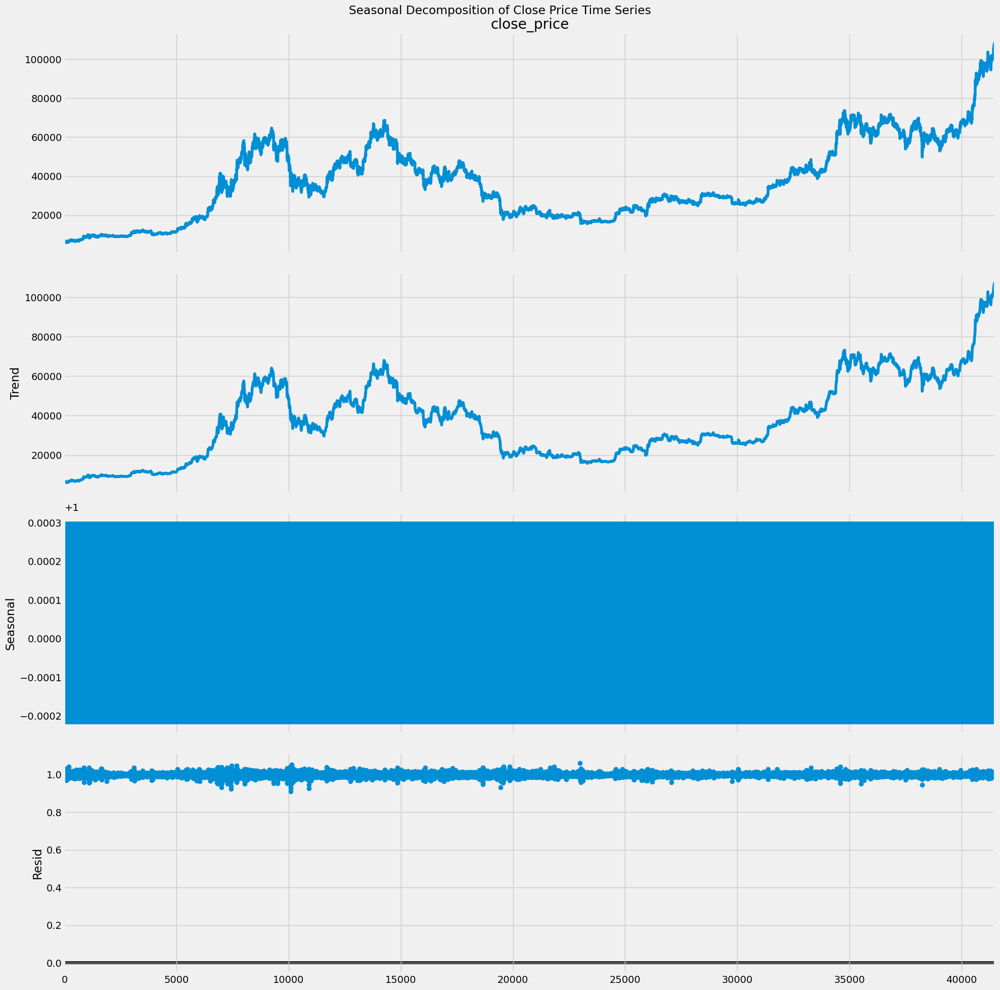

In [ ]:
#Check if data has seasonality
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(df['close_price'], model='multiplicative', period=12, extrapolate_trend='freq')  # Adjust period based on your data frequency

result.plot()
plt.suptitle('Seasonal Decomposition of Close Price Time Series')
plt.tight_layout()
plt.show()

From the figure, it can be concluded there is no element of seasonality in this dataset.

In conclusion, the dataset is considered as data with trend and without seasonality, to handle the missing values in the dataset, we can use linear interpolation to solve it

Why Linear Interpolation?

- It’s fast and straightforward.
- It respects the overall increasing trend in the data, while also handling the slight decreases.
- It uses the existing surrounding values to estimate missing data, providing reasonable approximations.


Identify the total number of missing values

In [ ]:
df.isna().sum()

,0
time,0
difficulty,135
estimated_leverage_ratio,0
addresses_count_active,0
exchange_whale_ratio,0
coinbase_premium_gap,32
taker_buy_volume,7
taker_buy_sell_ratio,7
blockreward_usd,0
fees_transaction_median_usd,0


In [ ]:
columns_with_missing_values = [
   'difficulty', 'coinbase_premium_gap', 'taker_buy_volume',
   'taker_buy_sell_ratio', 'tokens_transferred_mean'
]

df[columns_with_missing_values] = df[columns_with_missing_values].interpolate(method='linear', axis=0)
df.isna().sum()

,0
time,0
difficulty,0
estimated_leverage_ratio,0
addresses_count_active,0
exchange_whale_ratio,0
coinbase_premium_gap,0
taker_buy_volume,0
taker_buy_sell_ratio,0
blockreward_usd,0
fees_transaction_median_usd,0


For your information, we attempted data transformation, including log transformation, outliers removal and data normalization. However, we found that these processes made the outcomes more complex and adversely affected the nature of the dataset as well as the profitable results. Therefore, we decided to maintain the structure of the original data, focusing instead on cleaning the missing data and performing other necessary preprocessing steps.

# Data Visualization

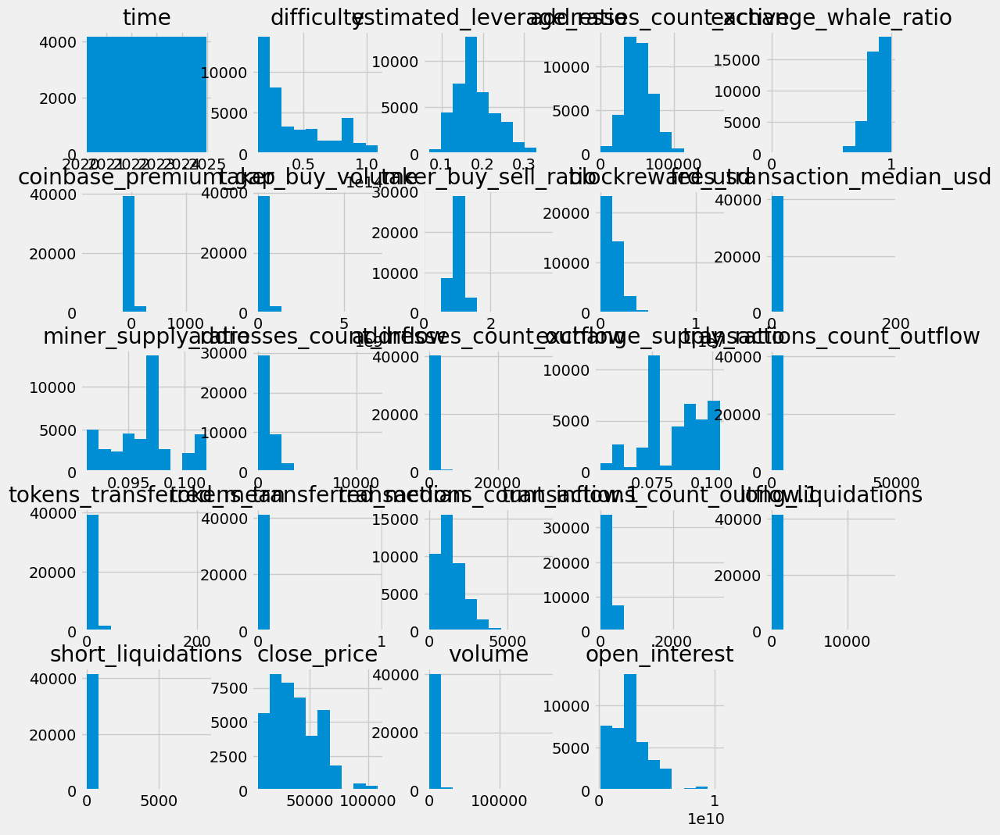

In [ ]:
df.hist(figsize=(12,12))
plt.show()

In [ ]:
df_numerical = df.select_dtypes(include=[np.number])
df_numerical.plot(kind='density', figsize=(14,14), subplots=True, layout=(22,2), title="Density plot of features", sharex=False)
plt.show()


In [ ]:
import calendar
fig = plt.figure(figsize=(7, 4))
ax = plt.axes()
months = list(calendar.month_abbr)[1:]
sns.barplot(data=df, y="close_price", x="time", ax=ax, palette="magma")
plt.xticks(rotation=90)
plt.title("Average share price by month")
ax.set(ylabel="Average closing price", xlabel="Month", xticklabels=months)
for i in ax.containers:
    ax.bar_label(i, fmt="%.2f", label_type="center", color="beige")
plt.show()

<ipython-input-107-2b060166ff68>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7caa9284e4d0> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7caa9284d1b0> (for post_execute):


KeyboardInterrupt: 

This code creates a boxen plot to visualize the distribution of the average close_price by month.

In [ ]:
groups = df.groupby("month")["close_price"]

plt.figure(figsize=(8, 5))
for i, group in groups:
    sns.kdeplot(group, fill=True, alpha=0.05, label=f"{months[i-1]}: Skewness - {group.skew():.2f}")
plt.title("Monthly distribution of share price.")
plt.legend(frameon=True, fontsize=8.5, facecolor="inherit")
plt.show()

This code creates KDE plots to show the distribution of close_price by month, with each curve labeled with the month's skewness. It highlights how the share price distribution changes across months.

# Volatility

array([<Axes: >, <Axes: >], dtype=object)

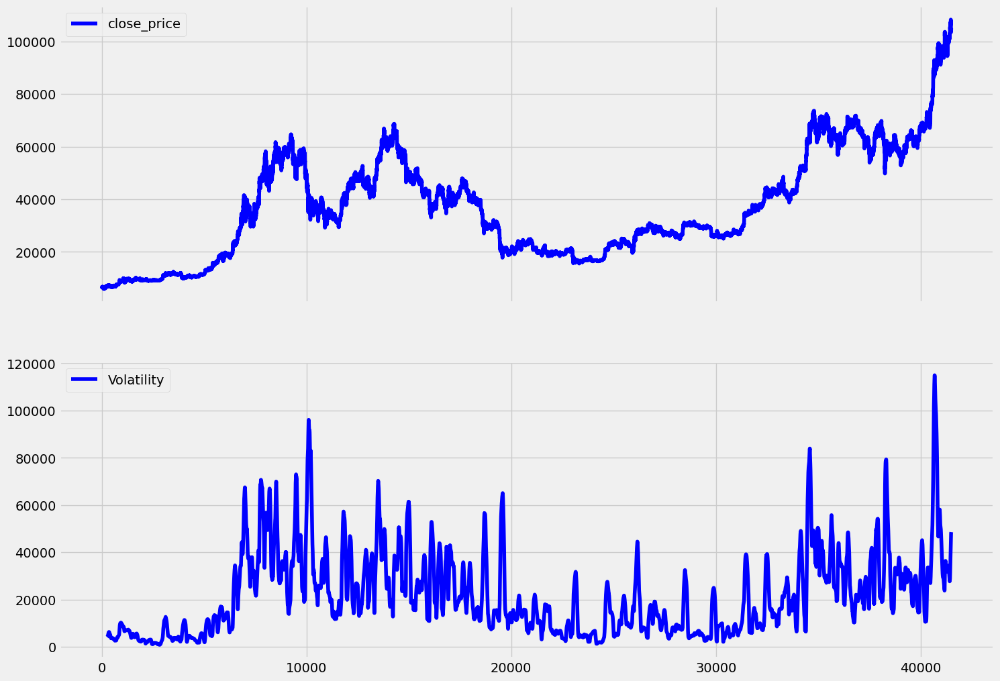

In [ ]:
df['Volatility'] = df['close_price'].rolling(window=252).std() * np.sqrt(252) #265
df[['close_price', 'Volatility']].plot(subplots=True, color='blue',figsize=(16, 12))

There is low volatility in the period between 2020 to 2021.
Conversely, there is high volatility between 2021 to 2022.
We can analyse how the factors affect close price during these 2 distinct periods.

Some interesting insights from this:

exchange_supply_ratio, blockreward has high correlation regardless of volatility
coinbase_premium_gap has similar correlation in both
Liquidation seem to have little correlation in both
Interesting differences between both periods:

open_interest, which was found to have high correlations previously, turns out to have significantly lesser effect during high volatility periods.
miner supply ratio has strong negative correlation during low volatility, but strong positive correlation during high volatility.
blockreward has little negative correlation during low volatility, but is a strong factor during high volatility.
difficulty has strong positive correlation in low volatility periods, but is completely inverted to negative correlation during high volatility.

# Forecasting Model

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



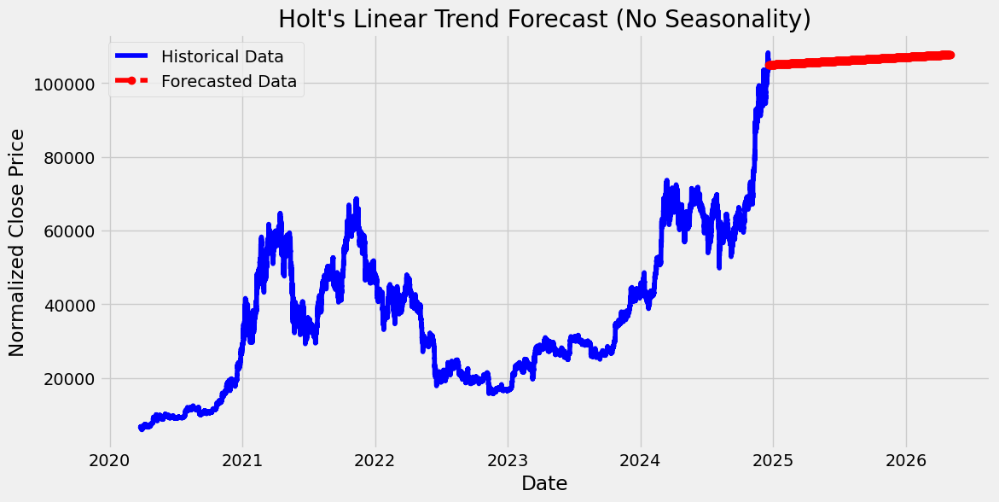

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Ensure the time column is in datetime format
df['time'] = pd.to_datetime(df['time'])

# Fit the Holt-Winters model with an additive trend and no seasonality
model = ExponentialSmoothing(df['close_price'], trend='add', seasonal=None)
model_fit = model.fit()

# Number of steps to forecast
forecast_steps = 500
forecast = model_fit.forecast(steps=forecast_steps)

# Generate the forecasted dates
forecast_dates = pd.date_range(df['time'].iloc[-1], periods=forecast_steps + 1, freq='D')[1:]

# Plot the historical and forecasted data
plt.figure(figsize=(12, 6))
plt.plot(df['time'], df['close_price'], label="Historical Data", color='blue')
plt.plot(forecast_dates, forecast, label="Forecasted Data", color='red', linestyle='--', marker='o')
plt.legend(loc='best')
plt.title('Holt\'s Linear Trend Forecast (No Seasonality)')
plt.xlabel('Date')
plt.ylabel('Normalized Close Price')
plt.grid(True)  # Add a grid for better readability
plt.show()






Holt’s Linear Trend Model is a good choice when the data shows a trend but does not exhibit seasonality. It extends simple exponential smoothing to capture linear trends over time.

Exit-Entries Logics

In [ ]:
forecast_diff = forecast.diff().dropna()

if forecast_diff.mean() > 0:
    trend_type = 'upward'  # Trend-following (buy if upward)
else:
    trend_type = 'downward'  # Trend-following (sell if downward)

print(f"The forecast suggests a {trend_type} trend.")

if trend_type == 'upward':
    print("Entry: Buy when the forecast suggests an upward trend.")
    # Set exit condition, e.g., when the price starts to fall or a certain threshold is reached
    print("Exit: Sell when the price starts to fall or when the forecast shows a downtrend.")
else:
    print("Entry: Sell when the forecast suggests a downward trend.")
    print("Exit: Buy when the forecast shows an upward trend.")

The forecast suggests a upward trend.
Entry: Buy when the forecast suggests an upward trend.
Exit: Sell when the price starts to fall or when the forecast shows a downtrend.


Our data is more to trend

# Signals


Signal methods, like MACD or RSI, help analyze features contributing to the close price by detecting trends, filtering noise, and identifying key turning points. They reveal how and when features like volume or supply ratios impact price movements, simplifying analysis and enhancing predictive insights in volatile cryptocurrency markets.

## Bollinger Bands

In [ ]:
# Calculate the 20-period Simple Moving Average (SMA)
df['SMA'] = df['close_price'].rolling(window=20).mean()

# Calculate the 20-period Standard Deviation (SD)
df['std'] = df['close_price'].rolling(window=20).std()

# Calculate the Upper Bollinger Band (UB) and Lower Bollinger Band (LB)
df['UB'] = df['SMA'] + (2 * df['std'])
df['LB'] = df['SMA'] - (2 * df['std'])

In [ ]:
# Generate trading signals
df['signal'] = 0
df.loc[df['close_price'] < df['LB'], 'signal'] = 1  # Buy signal
df.loc[df['close_price'] > df['UB'], 'signal'] = -1  # Sell signal

df['position'] = 0
df['trade'] = 0
df['equity'] = 0
df['pnl'] = 0

# Calculate positions and trades
df['position'] = df['signal'].shift(1)  # Position is the signal from the previous day
df['trade'] = df['position'].diff().fillna(df['position'])  # Trade is the change in position
df['pnl'] = df['close_price'].pct_change() * df['position'].shift(1)
df['equity'] = df['pnl'].cumsum()

In [ ]:
sharpe_ratio = np.sqrt(365 * 24) * df['pnl'].mean() / df['pnl'].std()
max_drawdown = df['pnl'].cumsum() - df['pnl'].cummax()
max_drawdown = max_drawdown.min()
print(sharpe_ratio)
print(max_drawdown)

-0.3470064620690524
-0.5080176574737046


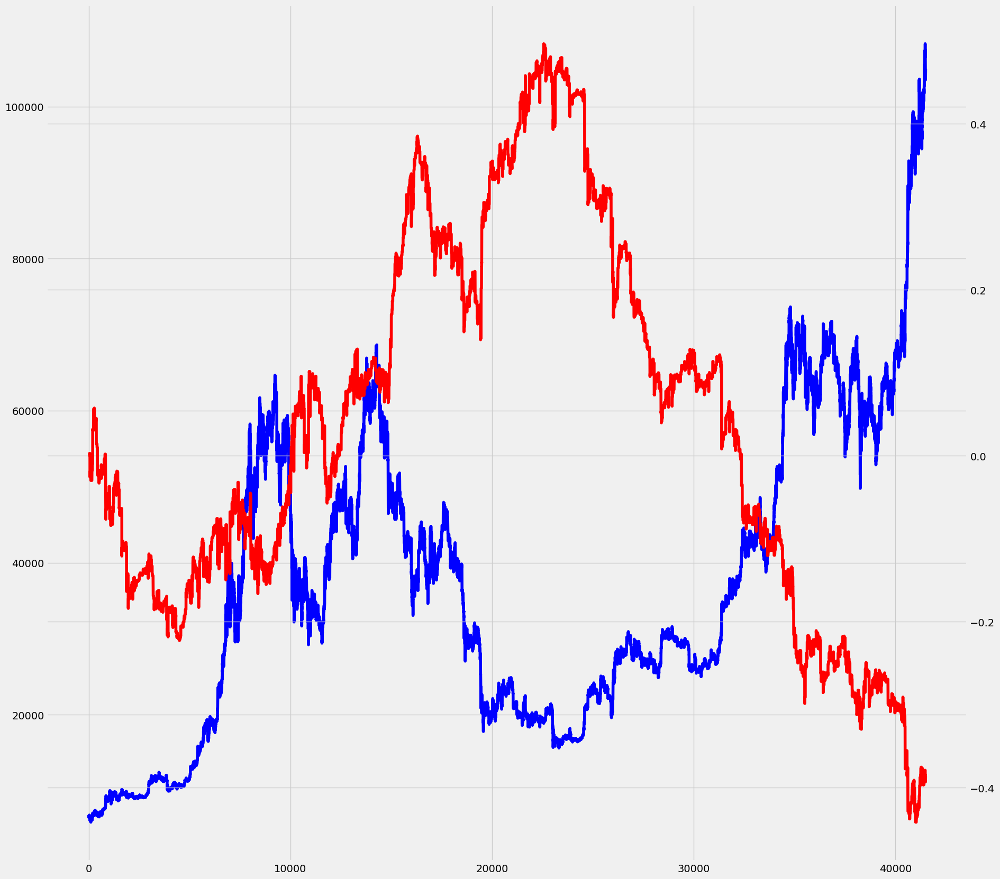

In [ ]:
# Initalize a Figure and Axes
fig, ax = plt.subplots()

# Plot the CO2 variable in blue
ax.plot(df["close_price"], color="blue");

# Create a twin Axes that shares the x-axis
ax2 = ax.twinx();

# Plot the relative temperature in red
ax2.plot(df["equity"], color="red");

In [ ]:
import plotly.graph_objs as go

# Create a Plotly figure
fig = go.Figure()

# Add the price chart
fig.add_trace(go.Scatter(x=df.index, y=df['close_price'], mode='lines', name='Price'))

# Add the Upper Bollinger Band (UB) and shade the area
fig.add_trace(go.Scatter(x=df.index, y=df['UB'], mode='lines', name='Upper Bollinger Band', line=dict(color='red')))
fig.add_trace(go.Scatter(x=df.index, y=df['LB'], fill='tonexty', mode='lines', name='Lower Bollinger Band', line=dict(color='green')))

# Add the Middle Bollinger Band (MA)
fig.add_trace(go.Scatter(x=df.index, y=df['SMA'], mode='lines', name='Middle Bollinger Band', line=dict(color='blue')))

# Customize the chart layout
fig.update_layout(title='Close Price with Bollinger Bands',
                  xaxis_title='Date',
                  yaxis_title='Price',
                  showlegend=True)

# Show the chart
fig.show()

When price moves to UB, it indicates overbought. If it moves towards LB, then it is oversold.


## RSI (Relative Strength Index)

In [ ]:
change = df['close_price'].diff()

change_up = change.copy()
change_down = change.copy()

change_up[change_up<0] = 0
change_down[change_down>0] = 0

change.equals(change_up+change_down)

avg_up = change_up.rolling(14).mean()
avg_down = change_down.rolling(14).mean().abs()

df['rsi'] = 100 * avg_up / (avg_up + avg_down)
df['signal'] = 0
df.loc[df['rsi'] < 30, 'signal'] = 1  # Buy signal when RSI is below 30
df.loc[df['rsi'] > 70, 'signal'] = -1  # Sell signal when RSI is above 70

In [ ]:
# Calculate positions and trades
df['position'] = df['signal'].shift(1)  # Position is the signal from the previous day
df['trade'] = df['position'].diff().fillna(df['position'])  # Trade is the change in position
df['pnl'] = df['close_price'].pct_change() * (df['position'].shift(1) - 0.0002)
df['equity'] = df['pnl'].cumsum()

In [ ]:
sharpe_ratio = np.sqrt(365 * 24) * df['pnl'].mean() / df['pnl'].std()
max_drawdown = df['pnl'].cumsum() - df['pnl'].cummax()
max_drawdown = max_drawdown.min()
print(sharpe_ratio)
print(max_drawdown)

-0.9329020041774683
-1.7771245679779226


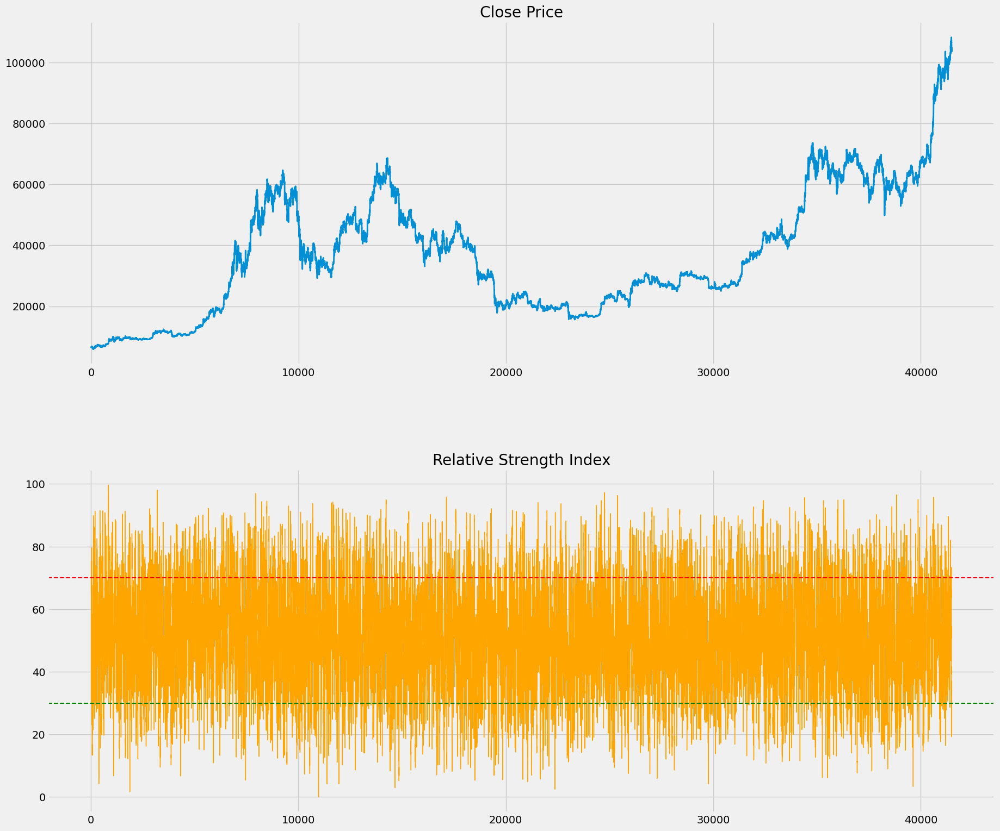

In [ ]:
# Set the theme of our chart
plt.style.use('fivethirtyeight')

# Make our resulting figure much bigger
plt.rcParams['figure.figsize'] = (20, 20)

# Create two charts on the same figure.
ax1 = plt.subplot2grid((10,1), (0,0), rowspan = 4, colspan = 1)
ax2 = plt.subplot2grid((10,1), (5,0), rowspan = 4, colspan = 1)

# First chart:
# Plot the closing price on the first chart
ax1.plot(df['close_price'], linewidth=2)
ax1.set_title('Close Price')

# Second chart
# Plot the RSI
ax2.set_title('Relative Strength Index')
ax2.plot(df['rsi'], color='orange', linewidth=1)
# Add two horizontal lines, signalling the buy and sell ranges.
# Oversold
ax2.axhline(30, linestyle='--', linewidth=1.5, color='green')
# Overbought
ax2.axhline(70, linestyle='--', linewidth=1.5, color='red')

plt.show()

Cross green is when we should have bought. Cross red is when we should have sold

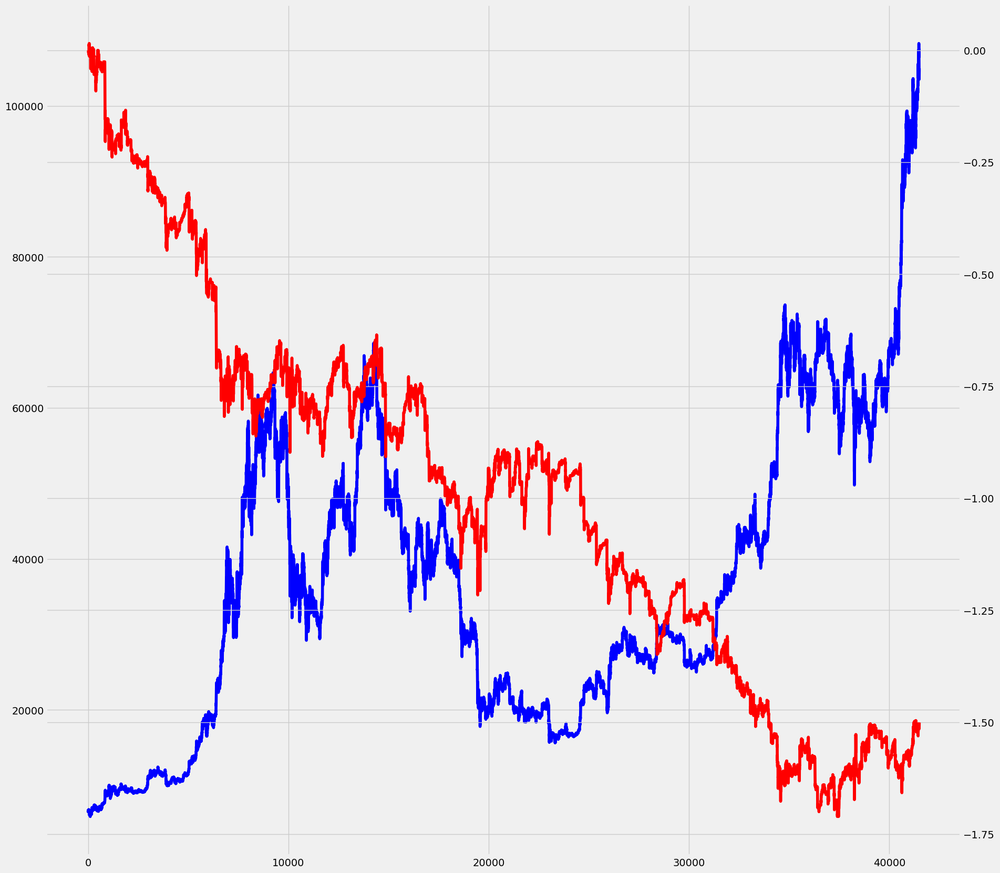

In [ ]:
# Initalize a Figure and Axes
fig, ax = plt.subplots()

# Plot the CO2 variable in blue
ax.plot(df["close_price"], color="blue");

# Create a twin Axes that shares the x-axis
ax2 = ax.twinx();

# Plot the relative temperature in red
ax2.plot(df["equity"], color="red");

## MACD

In [ ]:
# Calculate the 12-period EMA
df['EMA12'] = df['close_price'].ewm(span=12, adjust=False).mean()

# Calculate the 26-period EMA
df['EMA26'] = df['close_price'].ewm(span=26, adjust=False).mean()

# Calculate MACD (the difference between 12-period EMA and 26-period EMA)
df['MACD'] = df['EMA12'] - df['EMA26']

# Calculate the 9-period EMA of MACD (Signal Line)
df['Signal_Line'] = df['MACD'].ewm(span=9, adjust=False).mean()

df['macd_hist'] = df['MACD'] - df['Signal_Line']

In [ ]:
df['regime'] = pd.NA
df.loc[df['macd_hist'] > 0, 'regime'] = 1
df.loc[df['macd_hist'] < 0, 'regime'] = -1

In [ ]:
df['position'] = pd.NA
# Shift the 'regime' column to detect changes in regime
df['prev_regime'] = df['regime'].shift(1)

# Define the position logic
df.loc[(df['regime'] == 1) & (df['prev_regime'] == -1), 'position'] = 1  # Enter long position
df.loc[(df['regime'] == -1) & (df['prev_regime'] == 1), 'position'] = -1  # Enter short position

# Optionally fill the position forward
df['position'] = df['position'].ffill().fillna(0)

# Drop the helper 'prev_regime' column
df.drop(columns=['prev_regime'], inplace=True)

<ipython-input-136-c8dfa9797f7e>:10: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [ ]:
df['pnl'] = df['close_price'].pct_change() * (df['position'].shift(1) - 0.0002)
df['equity'] = df['pnl'].cumsum()

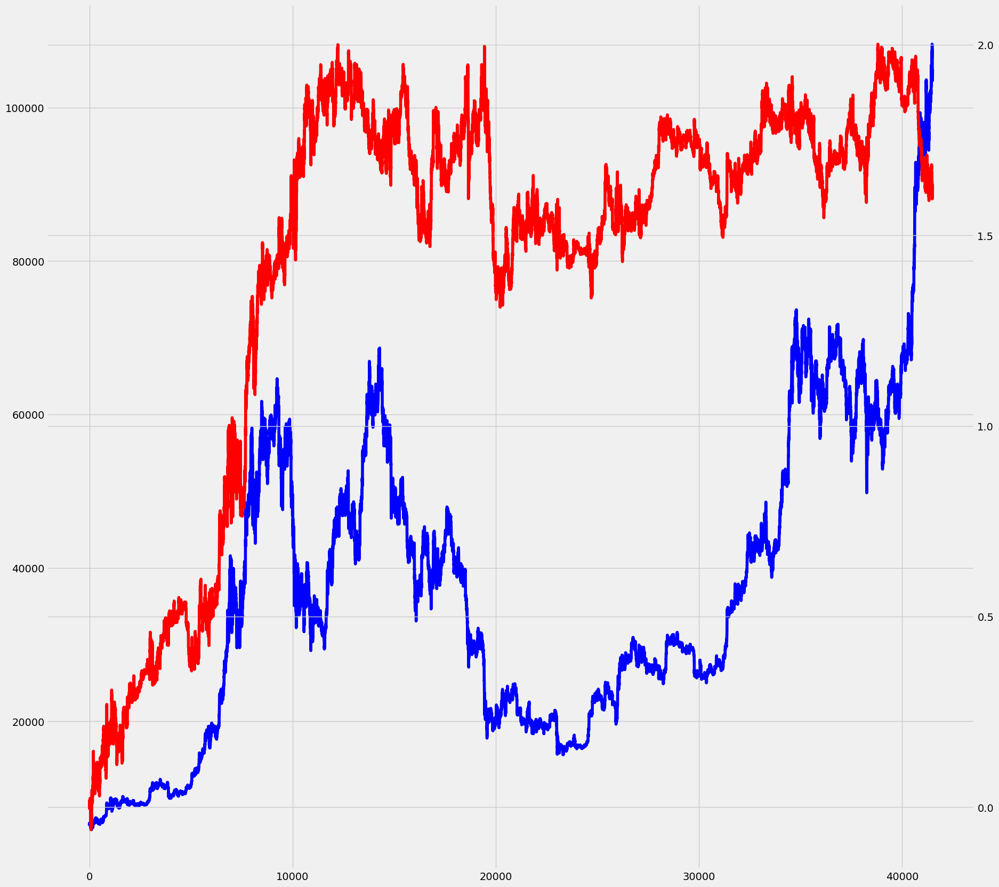

In [ ]:
# Initalize a Figure and Axes
fig, ax = plt.subplots()

# Plot the CO2 variable in blue
ax.plot(df["close_price"], color="blue");

# Create a twin Axes that shares the x-axis
ax2 = ax.twinx();

# Plot the relative temperature in red
ax2.plot(df["equity"], color="red");

In [ ]:
sharpe_ratio = np.sqrt(365 * 24) * df['pnl'].mean() / df['pnl'].std()
max_drawdown = df['pnl'].cumsum() - df['pnl'].cummax()
max_drawdown = max_drawdown.min()
print(sharpe_ratio)
print(max_drawdown)

0.5496920353086934
-0.08006206852583134


Compare three methods for signal generation, eventually we achieve a satisfactory sharpe ratio for MACD, which is a good indicator showing that our model is profitable.

# Analysis of Factors that affect the ``close_price``

<ipython-input-141-e8eef929eab2>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




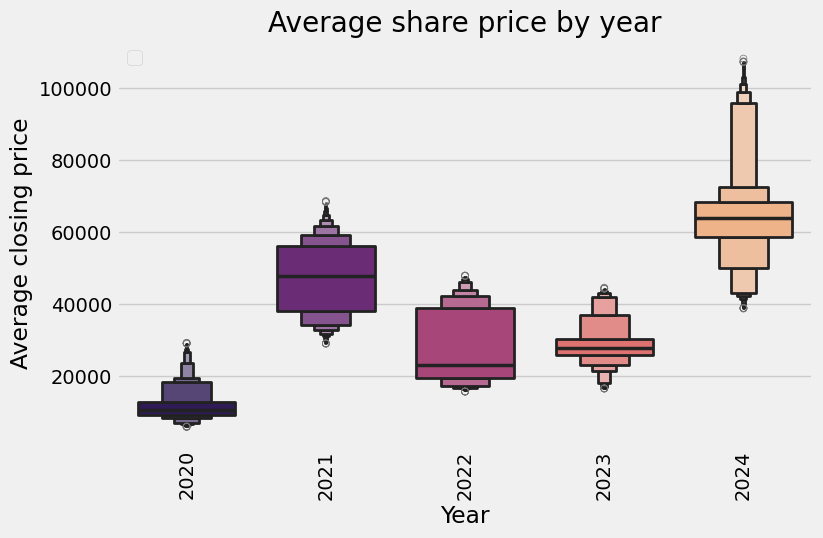

In [ ]:
df["year"] = df.time.dt.year
df["month"] = df.time.dt.month

fig = plt.figure(figsize=(8, 5))
ax = plt.axes()
sns.boxenplot(data=df, y="close_price", x="year", ax=ax, palette="magma", width=0.7)
# sns.swarmplot(data=df, y="value", x="year", ax=ax, palette="magma", size=4)
plt.xticks(rotation=90)
plt.title("Average share price by year")
ax.set(ylabel="Average closing price", xlabel="Year")
ax.legend(loc=2, frameon=True)
plt.show()

This code creates a boxen plot to visualize the distribution of the average close_price **by year** from the df DataFrame. It extracts the year from the time column, then plots how the closing prices vary across different years.

**Observation:** 2024 prices are by far the highest.

In [ ]:
df_lowvol = df[(df.index >= '2020-01-01') & (df.index <= '2021-12-31')]
df_highvol = df[(df.index >= '2021-04-01') & (df.index <= '2022-12-31')]

In [ ]:
corr = df.corrwith(df_lowvol['close_price']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlations']
plt.subplots(figsize = (10,10))
sns.heatmap(corr,annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black');
plt.title('Correlation w.r.t close_price in low volatility periods');

In [ ]:
corr = df.corrwith(df_highvol['close_price']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlations']
plt.subplots(figsize = (10,10))
sns.heatmap(corr,annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black');
plt.title('Correlation w.r.t close_price in high volatility periods');

Some interesting insights from this:
- exchange_supply_ratio, blockreward has high correlation regardless of volatility
- coinbase_premium_gap has similar correlation in both
- Liquidation seem to have little correlation in both

Interesting differences between both periods:
- open_interest, which was found to have high correlations previously, turns out to have significantly lesser effect during high volatility periods.
- miner supply ratio has strong negative correlation during low volatility, but strong positive correlation during high volatility.
- difficulty has strong positive correlation in low volatility periods, but is completely inverted to negative correlation during high volatility.